In [1]:
import numpy as np
from prettytable import PrettyTable
import os
import matplotlib.pyplot as plt
import matplotlib
import matplotlib.colors as colors
import matplotlib.ticker
import scipy.signal
import scipy.optimize as op
import plasmapy
import matplotlib.cm as cm
from scipy import special as sp
from scipy import integrate
from prettytable import PrettyTable
from scipy import fftpack
from tqdm import tqdm
%config InlineBackend.figure_format = 'svg'

# Simulation of electron hole from two stream instabilities

In [16]:
T = 1
k = 0.2
L = 2*np.pi/k

vmax = 5 # 速度最大值
nx = 500
nv = 500
dx = L/(nx-1)
dv = 2*vmax/(nv-1)
x = np.linspace(0, L, num=nx, endpoint=True)
v = np.linspace(-vmax, vmax, num=nv, endpoint=True)
V,X=np.meshgrid(v,x)
dt = 0.02
max_steps  = 20000
data_steps = max_steps
data_num = int(max_steps/data_steps)+1

path = '../data/'
print(data_num)
print('k=',k)
print('limited time=',2*np.pi/k/dv)
print('real time = ', max_steps*dt)

2
k= 0.2
limited time= 1567.6547341413068
real time =  400.0


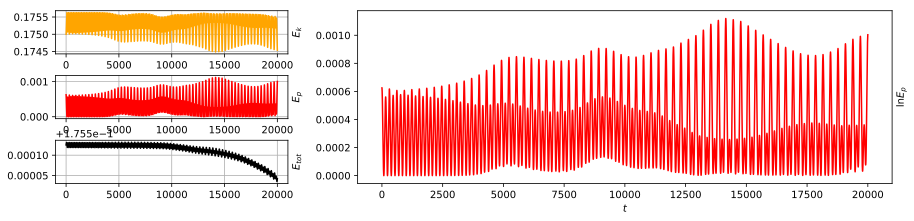

In [17]:
dataet = np.loadtxt(os.path.join(path,"tot_energy"))[0:max_steps]
dataep = np.loadtxt(os.path.join(path,"pot_energy"))[0:max_steps]
dataek = np.loadtxt(os.path.join(path,"kin_energy"))[0:max_steps]

t = np.linspace(0, max_steps, max_steps)
fig = plt.figure(figsize=(15, 3))

ax1 = plt.subplot2grid((3, 3), (0, 0))
ax1.plot(t, dataek, color='orange')
ax1.grid()
ax1.set_ylabel(r'$E_k$')
ax1.yaxis.set_label_position("right")

ax2 = plt.subplot2grid((3, 3), (1, 0))
ax2.plot(t, dataep, color='r')
ax2.grid()
ax2.set_ylabel(r'$E_p$')
ax2.yaxis.set_label_position("right")

ax3 = plt.subplot2grid((3, 3), (2, 0))
ax3.plot(t, dataet, color='black')
ax3.grid()
ax3.set_ylabel(r'$E_{tot}$')
ax3.yaxis.set_label_position("right")

axl2 = plt.subplot2grid((3, 3), (0, 1),colspan=2, rowspan=3)
axl2.plot(t, dataep, color='r')
axl2.set_ylabel(r'$\ln E_p$')
# axl2.set_yscale('log')
axl2.yaxis.set_label_position("right")

fig.subplots_adjust(bottom=0.1, top=0.9, hspace=.5, wspace=.3)
plt.xlabel(r'$t$')
plt.show()

In [18]:
progesses = np.arange(0,data_num,1)

f = []
phi = []

for progess in progesses:
    f_temp = np.loadtxt(os.path.join(path,"data"+str(progess)))
    f.append(f_temp)
    phi_temp = np.loadtxt(os.path.join(path,"phi"+str(progess)))
    phi.append(phi_temp)

In [19]:
fx0 = np.sum(f[0],axis=1)*dv
fv0 = np.sum(f[0],axis=0)*dx/L

In [28]:
fig = plt.figure(figsize=(10, 8))

test_frame = 1
fx = np.sum(f[test_frame],axis=1)*dv
fv = np.sum(f[test_frame],axis=0)*dx/L
# Z[np.where(Z<1e-8)]=0
lvs_idx = np.linspace(-10,1,num=50)
lvs = 10**lvs_idx

ax1 = plt.subplot2grid((2, 2), (0, 0))
# ax1cm = ax1.contourf(X, V, f[test_frame], levels=lvs,norm=colors.LogNorm(vmin=lvs.min(),vmax=lvs.max()),cmap=cm.plasma)
ax1cm = ax1.contourf(X, V, f[test_frame], levels=20,cmap=cm.plasma)
ax1.set_xlabel(r'$x$')
ax1.set_ylabel(r'$v$')
# ax1.set_ylim(4,6)

ax2 = plt.subplot2grid((2, 2), (0, 1))
ax2.plot(v, fv, color='red')
ax2.plot(v, fv0,'--', color='blue')
ax2.set_xlabel(r'$v$')
ax2.set_ylabel(r'$f_{v}$')
ax2.set_yscale('log')
ax2.grid()

ax3 = plt.subplot2grid((2, 2), (1, 0))
ax3.plot(x, fx, color='red')
ax3.plot(x, fx0,'--', color='blue')
ax2.set_xlabel(r'$v$')
ax3.set_xlabel(r'$x$')
ax3.set_ylabel(r'$fx$')
ax3.grid()

ax4 = plt.subplot2grid((2, 2), (1, 1))
ax4.plot(x, phi[test_frame], color='red')
ax4.plot(x, phi[0],'--', color='blue')
ax4.set_xlabel(r'$x$')
ax4.set_ylabel(r'$\phi$')
ax4.grid()

plt.tight_layout()

In [26]:
plt.contourf(X, V, f[test_frame], levels=20, cmap=cm.plasma)
plt.xlim(0.25*L,0.75*L)
plt.ylim(-2.5,2.5)
plt.show()

In [22]:
def phi4_theo(x,a,da):
    xp = (x-L/2)/da
    return a*np.cosh(xp)**(-4)

def phi2_theo(x,a,da):
    xp = (x-L/2)/da
    return a*np.cosh(xp)**(-2)

def phiexp_theo(x,a,da):
    xp = (x-L/2)/da
    return a*np.exp(-xp*xp/da)

from scipy.optimize import curve_fit
para4,pcov=curve_fit(phi4_theo,x,phi[1])
para2,pcov=curve_fit(phi2_theo,x,phi[1])
paraex,pcov=curve_fit(phiexp_theo,x,phi[1])
print(para4)
print(para2)
print(paraex)

[ 0.65101783 11.17210692]
[0.65793082 7.49256168]
[0.64290683 4.12066598]


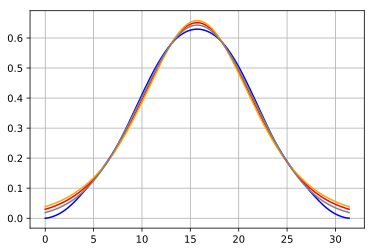

In [29]:
plt.plot(x,phi[1],color='blue')
plt.plot(x,phi4_theo(x,para4[0],para4[1]),color='red')
plt.plot(x,phi2_theo(x,para2[0],para2[1]),color='orange')
plt.plot(x,phiexp_theo(x,paraex[0],paraex[1]),color='gray')
plt.grid()
plt.show()

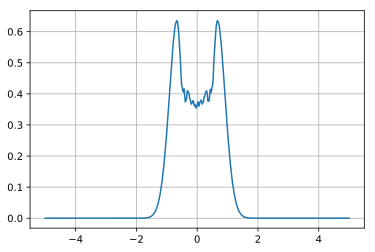

In [25]:
plt.plot(v,f[1][250])
# plt.yscale('log')
plt.grid()
plt.show()